In [1]:
import pandas as pd
import numpy as np
import math
from IPython.display import Markdown
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

from utils.common.merge_df import (merge_forcast_and_train_df,
                                   remove_NaN_rows)
from utils.common.train_model import (train_model,
                                      train_model_cv,
                                      train_model_stacking)
from utils.common.test_model import (test_model_cv)
from utils.common.create_features import (create_seasons,
                                          create_datetime_features,
                                          create_adjusted_values,
                                          check_if_in_daylight,
                                          create_rolling_avg,
                                            astral,
                                            deseasonalized_temperature,
                                            create_lag_features)

In [2]:
df_forecast = pd.read_parquet('../Daten/forecasts.parquet')
df_test1 = pd.read_parquet('../Daten/energy_test1.parquet')
df_test2 = pd.read_parquet('../Daten/energy_test2.parquet')
df_train = pd.read_parquet('../Daten/energy_train.parquet')

In [3]:
# entferne alle NaN Werte aus den Daten
df_train, df_forecast = remove_NaN_rows(df_train, df_forecast)


In [4]:

# merge die Daten
merged_df = merge_forcast_and_train_df(df_forecast, df_train)

# merge test 1
merged_test_df = merge_forcast_and_train_df(df_forecast, df_test1)

# merge test 2
merged_test2_df = merge_forcast_and_train_df(df_forecast, df_test2)

In [5]:
# Erstelle Jahreszeiten als categorical feature
merged_df = await create_seasons(merged_df)

# Erstelle Spalten für Stunden und Monate
merged_df = await create_datetime_features(merged_df)
merged_df = await astral(merged_df)
merged_df = await deseasonalized_temperature(merged_df)

# Erstelle Spalten für die adjustierten Werte
# Können wir wieder auskommentieren wenn wir das wieder testen 
merged_df = await create_adjusted_values(merged_df)
merged_df = await create_rolling_avg(merged_df)
#merged_df = await create_lag_features(merged_df)

merged_df = merged_df[merged_df['valid_time'].between(24, 30)]
merged_df.query("`Weather Model` == 'NCEP GFS'")


# create features for test data
merged_test_df = await create_seasons(merged_test_df)
merged_test2_df = await create_seasons(merged_test2_df)

merged_test_df = await create_datetime_features(merged_test_df)
merged_test2_df = await create_datetime_features(merged_test2_df)

merged_test_df = await astral(merged_test_df)
merged_test2_df = await astral(merged_test2_df)

merged_test_df = await deseasonalized_temperature(merged_test_df)
merged_test2_df = await deseasonalized_temperature(merged_test2_df)

merged_test_df = await create_rolling_avg(merged_test_df)
merged_test2_df = await create_rolling_avg(merged_test2_df)

merged_test_df = await create_adjusted_values(merged_test_df)
merged_test2_df = await create_adjusted_values(merged_test2_df)

#merged_test_df = await create_lag_features(merged_test_df)
#merged_test2_df = await create_lag_features(merged_test2_df)

merged_test_df = merged_test_df[merged_test_df['valid_time'].between(24, 30)]
merged_test_df.query("`Weather Model` == 'NCEP GFS'")
merged_test2_df = merged_test2_df[merged_test2_df['valid_time'].between(24, 30)]
merged_test2_df.query("`Weather Model` == 'NCEP GFS'")



/home/datata1/Documents/ML1/Analyse_Training/utils/common/create_features.py:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Rolling_Avg_SolarDownwardRadiation'].fillna(df['Median_SolarDownwardRadiation'], inplace=True)
/home/datata1/Documents/ML1/Analyse_Training/utils/common/create_features.py:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the interme

,dtm,ref_datetime,Solar_capacity_mwp,valid_time,SolarDownwardRadiation,CloudCover,Temperature,Weather Model,valid_datetime,Season,...,radiation_lag1,radiation_lag2,temp_lag1,adjusted_radiation,adjusted_temperature,Temperature_sqaured,solar_efficiency,solar_temperature,SolarDownwardRadiation_CloudCover,SolarDownwardRadiation_Temperature
1,2023-10-31 01:00:00+00:00,2023-10-30 00:00:00+00:00,2452.922019,25,0.00,0.86470,9.539495,NCEP GFS,2023-10-31 01:00:00+00:00,Herbst,...,0.000000,0.00,7.945722,0.0000,8.248801,91.001974,0.000000,23399.638486,0.0000,0.0000
3,2023-10-31 02:00:00+00:00,2023-10-30 00:00:00+00:00,2452.922019,26,0.00,0.74235,9.315203,NCEP GFS,2023-10-31 02:00:00+00:00,Herbst,...,0.010957,0.00,7.602008,0.0000,6.915141,86.773002,0.000000,22849.465848,0.0000,0.0000
5,2023-10-31 03:00:00+00:00,2023-10-30 00:00:00+00:00,2452.922019,27,0.00,0.63165,9.083450,NCEP GFS,2023-10-31 03:00:00+00:00,Herbst,...,0.000000,0.00,7.319525,0.0000,5.737562,82.509070,0.000000,22280.995294,0.0000,0.0000
7,2023-10-31 04:00:00+00:00,2023-10-30 00:00:00+00:00,2452.922019,28,0.00,0.56565,8.950796,NCEP GFS,2023-10-31 04:00:00+00:00,Herbst,...,0.006748,0.00,7.065326,0.0000,5.063018,80.116751,0.000000,21955.604910,0.0000,0.0000
9,2023-10-31 05:00:00+00:00,2023-10-30 00:00:00+00:00,2452.922019,29,0.00,0.53030,8.805913,NCEP GFS,2023-10-31 05:00:00+00:00,Herbst,...,0.010799,0.00,6.817285,0.0000,4.669776,77.544103,0.000000,21600.217827,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14523,2024-11-22 19:00:00+00:00,2024-11-21 18:00:00+00:00,2776.562944,25,2.00,0.37000,0.970000,NCEP GFS,2024-11-22 19:00:00+00:00,Herbst,...,2.000000,0.00,0.970000,1.2600,0.358900,0.940900,5553.125888,2693.266055,0.7400,1.9400
14525,2024-11-22 20:00:00+00:00,2024-11-21 18:00:00+00:00,2776.562903,26,0.00,0.47000,0.760000,NCEP GFS,2024-11-22 20:00:00+00:00,Herbst,...,0.000000,2.00,0.760000,0.0000,0.357200,0.577600,0.000000,2110.187807,0.0000,0.0000
14527,2024-11-22 21:00:00+00:00,2024-11-21 18:00:00+00:00,2776.562872,27,0.58,0.53000,0.330000,NCEP GFS,2024-11-22 21:00:00+00:00,Herbst,...,0.580000,0.00,0.330000,0.2726,0.174900,0.108900,1610.406466,916.265748,0.3074,0.1914
14529,2024-11-22 22:00:00+00:00,2024-11-21 18:00:00+00:00,2776.562858,28,0.31,0.63000,0.110000,NCEP GFS,2024-11-22 22:00:00+00:00,Herbst,...,0.310000,0.58,0.110000,0.1147,0.069300,0.012100,860.734486,305.421914,0.1953,0.0341


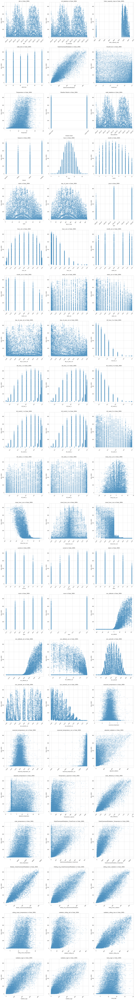

In [6]:
#import seaborn as sns
#import matplotlib.pyplot as plt

# Scatterplot für jedes Feature gegen die Zielvariablen
plt.style.use('seaborn-v0_8-whitegrid')

# Liste aller Features (ohne Zielvariable)
features = [col for col in merged_df.columns if col != 'Solar_MWh']

# Anzahl der Zeilen berechnen (aufrunden)
n_rows = math.ceil(len(features) / 3)

# Erstelle Figure und Axes für alle Plots
fig, axes = plt.subplots(n_rows, 3, figsize=(18, 6*n_rows))
axes = axes.ravel()  # Macht aus 2D-Array ein 1D-Array für einfachere Iteration

# Plots erstellen
for idx, feature in enumerate(features):
    sns.scatterplot(data=merged_df, x=feature, y='Solar_MWh', alpha=0.1, ax=axes[idx])
    axes[idx].set_title(f'{feature} vs Solar_MWh')
    axes[idx].tick_params(axis='x', rotation=45)  # Labels rotieren falls nötig

# Leere Plots entfernen falls Anzahl Features nicht durch 3 teilbar
for idx in range(len(features), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()


In [7]:
merged_df.head(100)

,dtm,ref_datetime,Solar_capacity_mwp,Solar_MWh,valid_time,SolarDownwardRadiation,CloudCover,Temperature,Weather Model,valid_datetime,...,SolarDownwardRadiation_Temperature,Median_SolarDownwardRadiation,Rolling_Avg_SolarDownwardRadiation,rolling_mean_radiation,rolling_mean_temperature,radiation_rolling_std,radiation_rolling_max,radiation_lag1,radiation_lag2,temp_lag1
0,2020-09-21 00:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,24,0.000000,0.327759,12.216522,DWD ICON,2020-09-21 00:00:00+00:00,...,0.000000,0.000000,0.000000,0.000000,12.228267,0.000000,0.000000,0.000000,0.000000,0.000000
1,2020-09-21 00:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,24,0.000000,0.002000,12.240011,NCEP GFS,2020-09-21 00:00:00+00:00,...,0.000000,0.000000,0.000000,0.002946,12.157506,0.000000,0.000000,0.000000,0.000000,12.216522
2,2020-09-21 01:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,25,0.008838,0.436067,12.015985,DWD ICON,2020-09-21 01:00:00+00:00,...,0.106196,0.004419,0.004419,0.002946,12.096160,0.005103,0.008838,0.000000,0.000000,12.240011
3,2020-09-21 01:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,25,0.000000,0.003000,12.032483,NCEP GFS,2020-09-21 01:00:00+00:00,...,0.000000,0.004419,0.002209,0.008074,11.954034,0.005103,0.008838,0.008838,0.000000,12.015985
4,2020-09-21 02:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,26,0.015384,0.468752,11.813635,DWD ICON,2020-09-21 02:00:00+00:00,...,0.181740,0.007692,0.006055,0.005128,11.893166,0.007720,0.015384,0.000000,0.008838,12.032483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,2020-09-22 23:00:00+00:00,2020-09-21 18:00:00+00:00,2130.573290,0.0,29,0.024536,0.721492,16.275776,DWD ICON,2020-09-22 23:00:00+00:00,...,0.399345,0.012268,0.009105,0.012705,16.078547,0.014166,0.024536,0.000000,0.000000,16.103310
96,2020-09-23 00:00:00+00:00,2020-09-22 00:00:00+00:00,2130.569336,0.0,24,0.013580,0.769511,15.856555,DWD ICON,2020-09-23 00:00:00+00:00,...,0.215337,0.006790,0.009529,0.012705,15.853904,0.012291,0.024536,0.024536,0.000000,16.275776
97,2020-09-23 00:00:00+00:00,2020-09-22 00:00:00+00:00,2130.569336,0.0,24,0.000000,0.206500,15.429380,NCEP GFS,2020-09-23 00:00:00+00:00,...,0.000000,0.006790,0.009529,0.004527,15.557736,0.012291,0.024536,0.013580,0.024536,15.856555
98,2020-09-23 01:00:00+00:00,2020-09-22 00:00:00+00:00,2130.569336,0.0,25,0.000000,0.808018,15.387274,DWD ICON,2020-09-23 01:00:00+00:00,...,0.000000,0.000000,0.009529,0.000000,15.292443,0.007841,0.013580,0.000000,0.013580,15.429380


['num__SolarDownwardRadiation' 'num__rbf_hour_0' 'num__rbf_hour_1'
 'num__rbf_hour_2' 'num__rbf_month_0' 'num__rbf_month_1'
 'num__rbf_month_2' 'num__sun_altitude' 'num__sun_azimuth_sin'
 'num__sun_azimuth_cos' 'num__sun_altitude_sin' 'num__sun_altitude_cos'
 'num__solar_efficiency' 'num__Median_SolarDownwardRadiation'
 'num__radiation_lag1' 'num__radiation_rolling_max' 'cat__week_1'
 'cat__week_2' 'cat__week_3' 'cat__week_4' 'cat__week_5' 'cat__week_6'
 'cat__week_7' 'cat__week_8' 'cat__week_9' 'cat__week_10' 'cat__week_11'
 'cat__week_12' 'cat__week_13' 'cat__week_14' 'cat__week_15'
 'cat__week_16' 'cat__week_17' 'cat__week_18' 'cat__week_19'
 'cat__week_20' 'cat__week_21' 'cat__week_22' 'cat__week_23'
 'cat__week_24' 'cat__week_25' 'cat__week_26' 'cat__week_27'
 'cat__week_28' 'cat__week_29' 'cat__week_30' 'cat__week_31'
 'cat__week_32' 'cat__week_33' 'cat__week_34' 'cat__week_35'
 'cat__week_36' 'cat__week_37' 'cat__week_38' 'cat__week_39'
 'cat__week_40' 'cat__week_41' 'cat__week_

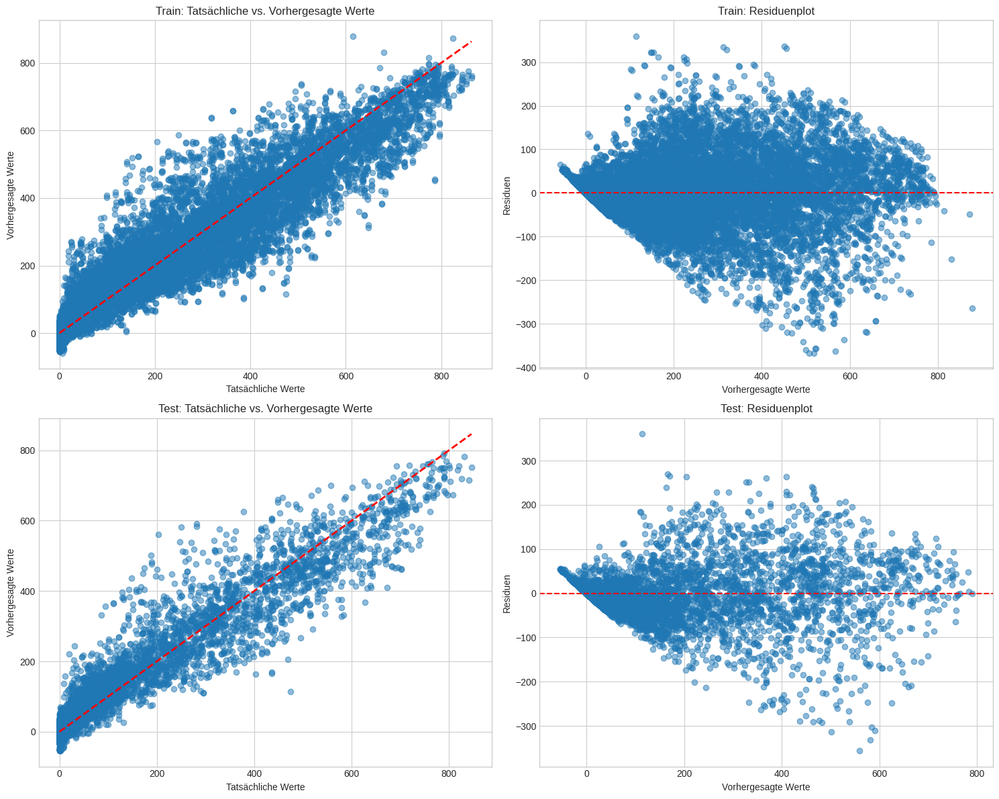

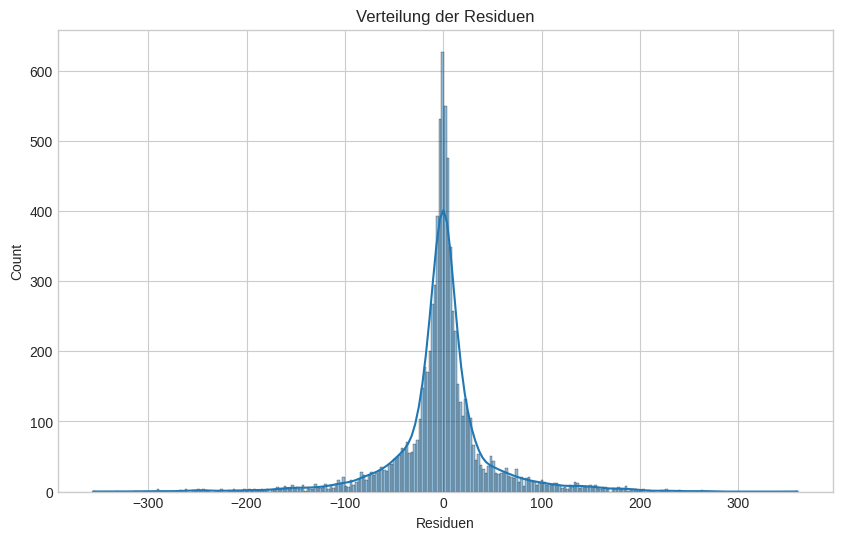

In [8]:
param_grid = {
    'alpha': np.linspace(0.1, 100, 50),
}

merged_df_copy = merged_df.copy()


pipeline, evaluation_md, test_col, best_params, preprocessor = train_model_cv(merged_df_copy, 
                                                      ["SolarDownwardRadiation",
                                                       "week",
                                                       "hour",
                                                       "month",
                                                       "rbf_hour_0",
                                                       "rbf_hour_1",
                                                       "rbf_hour_2",
                                                       "rbf_month_0",
                                                       "rbf_month_1",
                                                       "rbf_month_2",
                                                       #"rbf_week_0",
                                                       #"rbf_week_1",
                                                       #"rbf_week_2",
                                                       "sun_altitude",
                                                      # "sun_azimuth",
                                                       #"sunset", 
                                                       #"sunrise",
                                                       'sun_azimuth_sin',
                                                       'sun_azimuth_cos',
                                                       "sun_altitude_sin",
                                                       "sun_altitude_cos",
                                                       #"Weather Model",
                                                       #"Solar_capacity_mwp",
                                                       #"Temperature",
                                                       #"CloudCover",
                                                       #"Temperature_sqaured",
                                                       "solar_efficiency",
                                                       #"SolarDownwardRadiation_CloudCover",
                                                       #"SolarDownwardRadiation_Temperature",
                                                       #"seasonal_temperature",
                                                       #"seasonal_temperature_sin",
                                                       #"seasonal_temperature_cos",
                                                       #"Rolling_Avg_SolarDownwardRadiation",
                                                       #"rolling_mean_radiation",
                                                       # "rolling_mean_temperature",
                                                       "Median_SolarDownwardRadiation",
                                                       "radiation_lag1",
                                                       #"radiation_lag2",
                                                       "radiation_rolling_max",
                                                       #"radiation_rolling_std",
                                                          #"temp_hour_sin",
                                                          #"temp_hour_cos",
                                                         #"cloud_hour_sin",
                                                          #"cloud_hour_cos"
                                                       
                                                       
                                                                ], 
                                                    "Solar_MWh",
                                                       param_grid)

In [9]:
display(Markdown(evaluation_md))

### Ridge(alpha=np.float64(0.1)) Evaluation

| Dataset | R² | RMSE | MAE | Rows | Columns |
|---------|--------:|------------:|--------:|-------:|-------:|
| Train   | 0.91894 | 52.49 | 29.99 | 31524 | 105 |
| Test    | 0.92138 | 51.32 | 29.46 | 7881 | 105 |

### Top 10 Coefficients

| Feature Name                       |   Coefficient |
|:-----------------------------------|--------------:|
| num__solar_efficiency              |    402.34     |
| num__SolarDownwardRadiation        |   -385.867    |
| num__Median_SolarDownwardRadiation |    168.687    |
| num__sun_altitude_sin              |     82.0784   |
| cat__week_16                       |     66.3315   |
| cat__week_15                       |     63.3044   |
| num__sun_altitude                  |    -60.264    |
| cat__week_14                       |     53.2109   |
| num__sun_azimuth_cos               |    -50.0704   |
| cat__week_12                       |     48.2738   |
| cat__month_4                       |    -44.4665   |
| cat__week_11                       |     42.2359   |
| num__radiation_rolling_max         |    -42.0554   |
| cat__week_10                       |     41.3017   |
| cat__week_50                       |    -38.5891   |
| cat__week_8                        |     37.0045   |
| cat__week_35                       |    -36.7629   |
| cat__hour_6                        |    -36.264    |
| cat__week_53                       |    -35.03     |
| cat__week_51                       |    -33.1076   |
| cat__week_52                       |    -31.1713   |
| cat__month_1                       |     31.0417   |
| cat__week_1                        |    -30.1283   |
| cat__hour_7                        |    -30.1122   |
| cat__week_49                       |    -29.3426   |
| cat__week_4                        |    -28.7853   |
| cat__month_12                      |     28.3482   |
| cat__week_48                       |    -27.4775   |
| cat__hour_17                       |    -26.9884   |
| cat__hour_0                        |     26.8961   |
| cat__week_2                        |    -26.466    |
| cat__week_27                       |    -26.4358   |
| cat__hour_10                       |     25.4636   |
| cat__week_46                       |    -25.3961   |
| cat__week_3                        |    -25.1468   |
| cat__hour_11                       |     25.0144   |
| cat__week_17                       |     23.1774   |
| cat__week_20                       |     23.024    |
| cat__week_47                       |    -22.6716   |
| cat__hour_1                        |     22.6469   |
| cat__month_11                      |     22.4083   |
| cat__month_3                       |    -22.3828   |
| cat__month_5                       |    -22.2621   |
| cat__hour_5                        |    -22.2055   |
| cat__week_13                       |     21.7432   |
| cat__hour_16                       |    -21.5699   |
| cat__week_18                       |     21.1632   |
| cat__week_6                        |     20.7135   |
| cat__week_21                       |     20.5452   |
| cat__week_45                       |    -20.1733   |
| cat__week_32                       |     18.5167   |
| cat__hour_12                       |     17.9825   |
| cat__week_29                       |    -17.9412   |
| cat__week_38                       |    -17.721    |
| cat__hour_18                       |    -17.2543   |
| cat__hour_23                       |     17.236    |
| cat__week_26                       |    -16.9727   |
| num__radiation_lag1                |     15.1721   |
| num__rbf_hour_0                    |     14.775    |
| num__rbf_month_0                   |     14.775    |
| cat__month_10                      |     14.7271   |
| cat__week_34                       |    -14.5457   |
| cat__hour_2                        |     14.2698   |
| cat__week_44                       |    -13.1947   |
| cat__hour_9                        |     13.1259   |
| num__rbf_hour_2                    |    -13.0724   |
| num__rbf_month_2                   |    -13.0724   |
| cat__week_5                        |     12.287    |
| cat__week_28                       |    -12.0653   |
| cat__hour_13                       |     12.0543   |
| cat__week_19                       |     11.7833   |
| cat__week_7                        |     11.743    |
| cat__week_23                       |     11.6333   |
| cat__month_9                       |     11.3609   |
| cat__month_6                       |    -11.0233   |
| cat__week_30                       |    -10.6975   |
| cat__month_8                       |    -10.6891   |
| num__sun_azimuth_sin               |    -10.3983   |
| cat__week_33                       |      9.93053  |
| cat__hour_8                        |     -9.91007  |
| cat__month_7                       |      9.52377  |
| cat__week_42                       |     -9.10169  |
| cat__hour_22                       |      9.02596  |
| cat__hour_4                        |     -8.79836  |
| cat__hour_19                       |     -8.72644  |
| cat__hour_15                       |     -8.57148  |
| cat__week_43                       |     -7.61152  |
| cat__week_36                       |     -7.56788  |
| cat__week_40                       |     -7.45944  |
| cat__week_9                        |      6.9461   |
| cat__month_2                       |     -6.5861   |
| cat__week_24                       |      5.85123  |
| cat__hour_14                       |      5.69106  |
| cat__week_31                       |      5.63998  |
| cat__week_25                       |     -4.67457  |
| cat__week_41                       |     -4.25132  |
| cat__hour_20                       |     -4.09998  |
| cat__week_22                       |      4.05284  |
| cat__hour_3                        |      3.73116  |
| num__rbf_month_1                   |     -3.6258   |
| num__rbf_hour_1                    |     -3.6258   |
| cat__week_39                       |      2.97916  |
| cat__week_37                       |     -2.90394  |
| cat__hour_21                       |      1.36277  |
| num__sun_altitude_cos              |     -0.385406 |

Number of coefficients that are zero: 0/105


Alpha value: 52.969075427129795


In [10]:
# scale the data
merged_test_pred_df = test_model_cv(pipeline, merged_test_df, test_col, preprocessor)
merged_test2_pred_df = test_model_cv(pipeline, merged_test2_df, test_col, preprocessor)

Series([], dtype: int64)
Empty DataFrame
Columns: [dtm, ref_datetime, Solar_capacity_mwp, valid_time, SolarDownwardRadiation, CloudCover, Temperature, Weather Model, valid_datetime, Season, hour, month, week, day_of_year, year, hour_sin, hour_cos, month_sin, month_cos, week_sin, week_cos, day_of_year_sin, day_of_year_cos, rbf_hour_0, rbf_hour_1, rbf_hour_2, rbf_month_0, rbf_month_1, rbf_month_2, rbf_week_0, rbf_week_1, rbf_week_2, temp_hour_sin, temp_hour_cos, cloud_hour_sin, cloud_hour_cos, sunrise, sunset, dawn, dusk, noon, sun_altitude, sun_altitude_sin, sun_altitude_cos, sun_azimuth, sun_azimuth_sin, sun_azimuth_cos, seasonal_temperature, seasonal_temperature_sin, seasonal_temperature_cos, Median_SolarDownwardRadiation, Rolling_Avg_SolarDownwardRadiation, rolling_mean_radiation, rolling_mean_temperature, radiation_rolling_std, radiation_rolling_max, radiation_lag1, radiation_lag2, temp_lag1, adjusted_radiation, adjusted_temperature, Temperature_sqaured, solar_efficiency, solar_temp

/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df[col] = 0
/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df[col] = 0
/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at o

In [11]:
merged_test_pred_df.to_pickle('test1.pkl')
merged_test2_pred_df.to_pickle('test2.pkl')

In [12]:
merged_test_pred_df

,dtm,ref_datetime,Solar_capacity_mwp,valid_time,SolarDownwardRadiation,CloudCover,Temperature,Weather Model,valid_datetime,Season,...,cat__hour_5,cat__hour_8,cat__week_48,cat__hour_18,cat__hour_17,cat__week_41,cat__hour_7,cat__hour_23,cat__month_10,Solar_MWh_pred
0,2023-01-01 00:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,24,0.000000,0.999570,10.612988,DWD ICON,2023-01-01 00:00:00+00:00,Winter,...,0,0,0,0,0,0,0,0,0,0.000000
1,2023-01-01 00:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,24,0.000000,0.995250,11.345912,NCEP GFS,2023-01-01 00:00:00+00:00,Winter,...,0,0,0,0,0,0,0,0,0,0.000000
2,2023-01-01 01:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,25,0.000000,1.000000,10.425348,DWD ICON,2023-01-01 01:00:00+00:00,Winter,...,0,0,0,0,0,0,0,0,0,0.000000
3,2023-01-01 01:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,25,0.000000,0.988300,10.601108,NCEP GFS,2023-01-01 01:00:00+00:00,Winter,...,0,0,0,0,0,0,0,0,0,0.000000
4,2023-01-01 02:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,26,0.021875,1.000000,10.405902,DWD ICON,2023-01-01 02:00:00+00:00,Winter,...,0,0,0,0,0,0,0,0,0,0.276062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14473,2023-10-30 22:00:00+00:00,2023-10-29 18:00:00+00:00,2452.979156,28,0.000000,0.834100,10.004807,NCEP GFS,2023-10-30 22:00:00+00:00,Herbst,...,0,0,0,0,0,0,0,0,0,0.000000
14474,2023-10-30 23:00:00+00:00,2023-10-29 18:00:00+00:00,2452.950587,29,0.001482,0.684612,8.263562,DWD ICON,2023-10-30 23:00:00+00:00,Herbst,...,0,0,0,0,0,0,0,0,0,0.000000
14475,2023-10-30 23:00:00+00:00,2023-10-29 18:00:00+00:00,2452.950587,29,0.000000,0.919800,9.773641,NCEP GFS,2023-10-30 23:00:00+00:00,Herbst,...,0,0,0,0,0,0,0,0,0,0.000000
14476,2023-10-31 00:00:00+00:00,2023-10-30 00:00:00+00:00,2452.922019,24,0.015666,0.638090,8.282245,DWD ICON,2023-10-31 00:00:00+00:00,Herbst,...,0,0,0,0,0,0,0,0,0,0.000000
